# 노드 따라하기!
(프로젝트는 아래에)

In [1]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

#### (1) 사진을 준비하자  

(1280, 1280, 3)


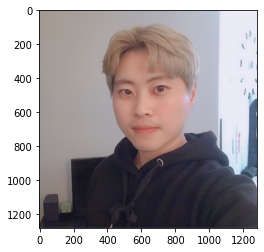

In [2]:
# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/selfie_0.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

#### (2) 세그멘테이션으로 사람 분리하기
#### (3) 시맨틱 세그멘테이션 다뤄보기 

In [3]:
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f1a4e2f8ee0>)

In [4]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [5]:
segvalues, output = model.segmentAsPascalvoc(img_path)

In [6]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

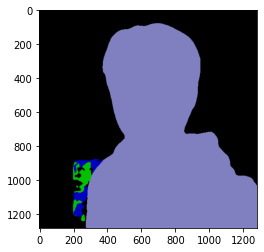

In [7]:
plt.imshow(output)
plt.show()

In [8]:
segvalues

{'class_ids': array([ 0,  9, 15, 18]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True]])}

In [9]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
chair
person
sofa


In [10]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [11]:
colormap[15]

array([192, 128, 128])

In [12]:
seg_color = (128,128,192)

(1280, 1280)


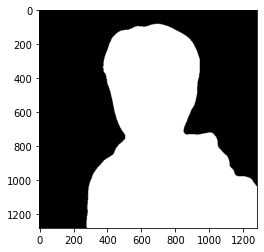

In [13]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

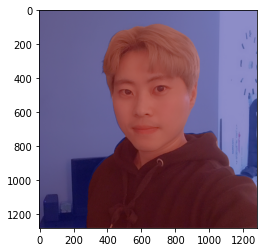

In [14]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

#### (4) 배경 흐리게 하기 

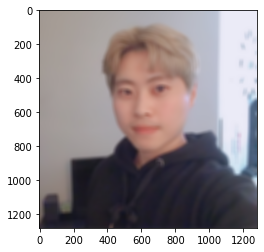

In [15]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (25,25))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

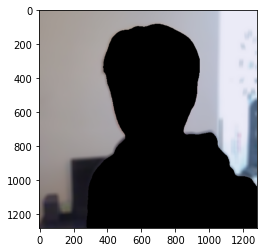

In [16]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

#### (5) 흐린 배경과 원본 영상 합성  

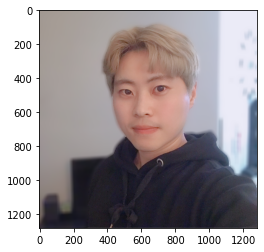

In [17]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

#### \* 배경을 흰색으로 채우기

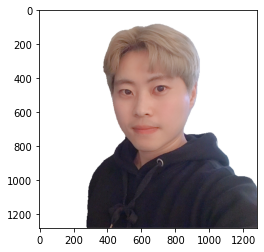

In [18]:
img_white = np.full((1280, 1280, 3), 255, dtype=np.uint8)

img_white_concat = np.where(img_mask_color==255, img_orig, img_white)
img_white_concat.shape
plt.imshow(cv2.cvtColor(img_white_concat, cv2.COLOR_BGR2RGB))
plt.show()

# Project: 인물 모드 문제점 찾기!

# Step 1. 인물모드 직접 해 보기

#### 최소 3장 이상의 인물모드 사진을 만들어 봅시다.  

In [19]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

In [20]:
def get_img_path(filename):
    img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/'+filename
    return img_path

def get_img(img_path):
    img_orig = cv2.imread(img_path) 
    print('Shape of {}: '.format(img_path.split('/')[-1]), img_orig.shape)
    return img_orig

In [21]:
def show_img(img_orig, figsize=(20,20)):
    plt.figure(figsize=figsize)
    if img_orig.shape[2] == 3:
        plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(img_orig)
    plt.show()

def show_imgs(img1, img2, img3, rows=1, cols=3, figsize=(20,20)):
    fig = plt.figure(figsize=figsize)
    ax1 = fig.add_subplot(rows, cols, 1)
    if img1.shape[2] == 3:
        ax1.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    else:
        ax1.imshow(img1)

    ax2 = fig.add_subplot(rows, cols, 2)
    if img2.shape[2] == 3:
        ax2.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    else:
        ax2.imshow(img2)

    ax3 = fig.add_subplot(rows, cols, 3)
    if img3.shape[2] == 3:
        ax3.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
    else:
        ax3.imshow(img3)
        
    plt.show()

Shape of img1.jpg:  (1440, 1080, 3)
Shape of img2.jpg:  (1440, 1080, 3)
Shape of img3.jpg:  (1440, 1080, 3)


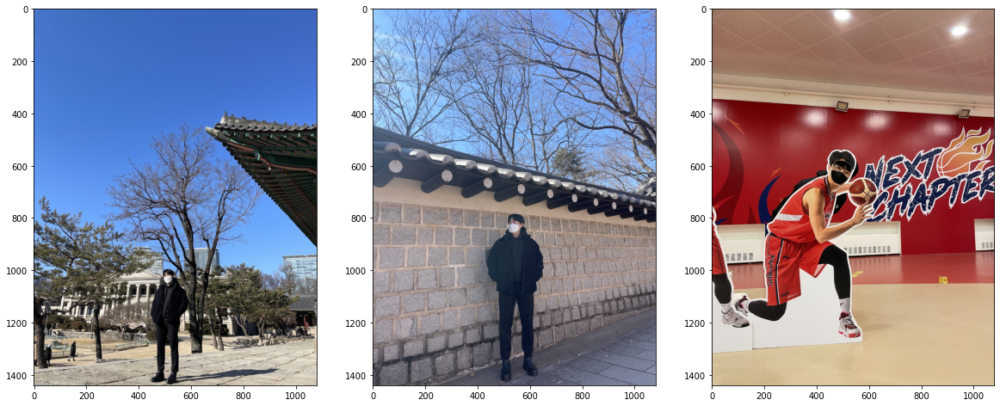

In [22]:
# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
img1_path = get_img_path('img1.jpg')
img2_path = get_img_path('img2.jpg')
img3_path = get_img_path('img3.jpg')
img1 = get_img(img1_path)
img2 = get_img(img2_path)
img3 = get_img(img3_path)

show_imgs(img1, img2, img3)

In [23]:
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f192f7638e0>)

In [24]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [26]:
#segvalues, output = model.segmentAsPascalvoc(img_path)
segvalues1, output1 = model.segmentAsPascalvoc(img1_path)
segvalues2, output2 = model.segmentAsPascalvoc(img2_path)
segvalues3, output3 = model.segmentAsPascalvoc(img3_path)

In [27]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

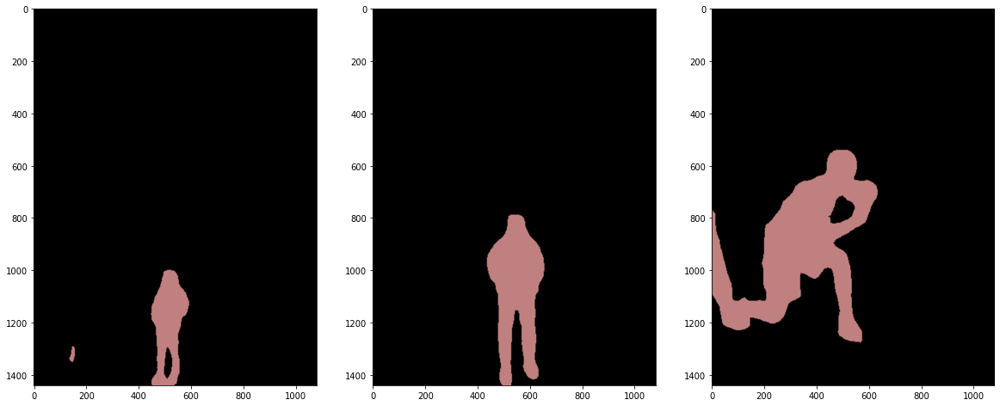

In [28]:
show_imgs(output1, output2, output3)

In [29]:
for idx, seg in enumerate([segvalues1, segvalues2, segvalues3]):
    print('* Label of Segmentation {} '.format(idx+1))
    for class_id in seg['class_ids']:
        print(LABEL_NAMES[class_id])
    print()

* Label of Segmentation 1 
background
person

* Label of Segmentation 2 
background
person

* Label of Segmentation 3 
background
person
sofa



In [30]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [31]:
colormap[15] # Person

array([192, 128, 128])

In [32]:
seg_color = (128,128,192) # 반대이므로 (BGR <-> RGB)

(1440, 1080)
(1440, 1080)
(1440, 1080)


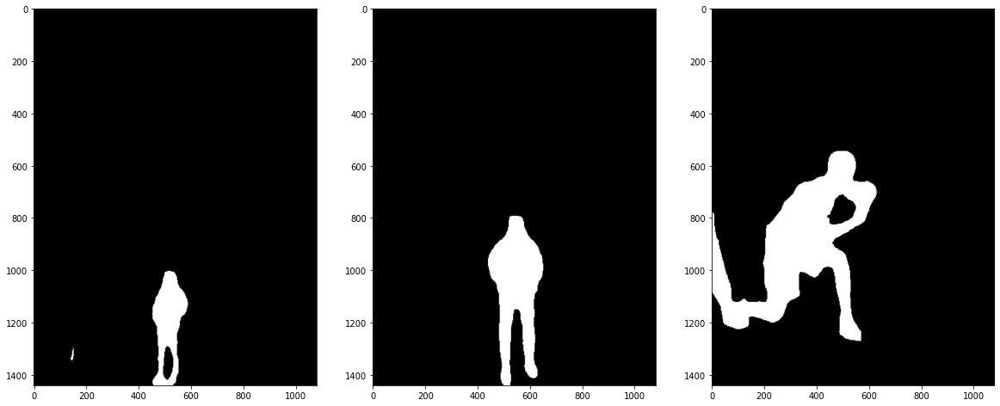

In [33]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
fig = plt.figure(figsize=(20, 20))

ax1 = fig.add_subplot(1, 3, 1)
seg_map1 = np.all(output1==seg_color, axis=-1)
print(seg_map1.shape)
ax1.imshow(seg_map1, cmap='gray')

ax2 = fig.add_subplot(1, 3, 2)
seg_map2 = np.all(output2==seg_color, axis=-1)
print(seg_map2.shape)
ax2.imshow(seg_map2, cmap='gray')

ax3 = fig.add_subplot(1, 3, 3)
seg_map3 = np.all(output3==seg_color, axis=-1)
print(seg_map3.shape)
ax3.imshow(seg_map3, cmap='gray')

plt.show()

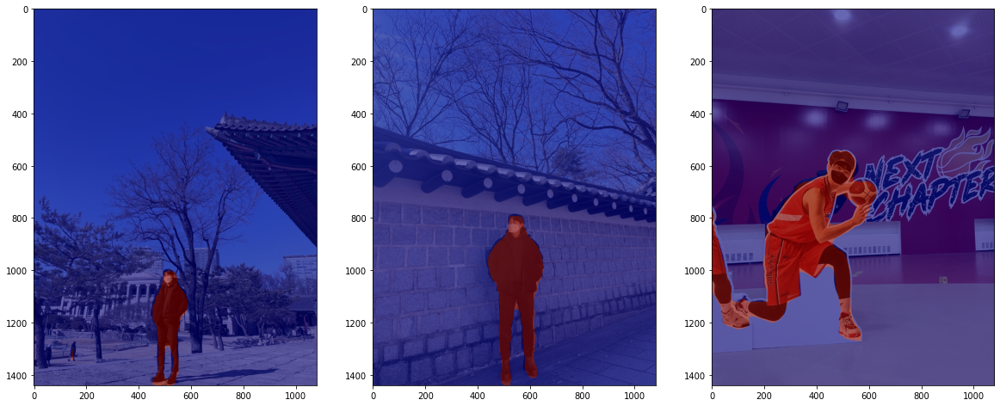

In [34]:
def get_seg_img(img, seg_map):
    img_show = img.copy()

    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255

    # 255와 0을 적당한 색상으로 바꿔봅니다
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    # 원본 이미지와 마스트를 적당히 합쳐봅니다
    # 0.6과 0.4는 두 이미지를 섞는 비율입니다.
    img_show = cv2.addWeighted(img_show, 0.4, color_mask, 0.6, 0.0)
    return img_show, img_mask

seg_img1, img_mask1 = get_seg_img(img1, seg_map1)
seg_img2, img_mask2 = get_seg_img(img2, seg_map2)
seg_img3, img_mask3 = get_seg_img(img3, seg_map3)

show_imgs(seg_img1, seg_img2, seg_img3)

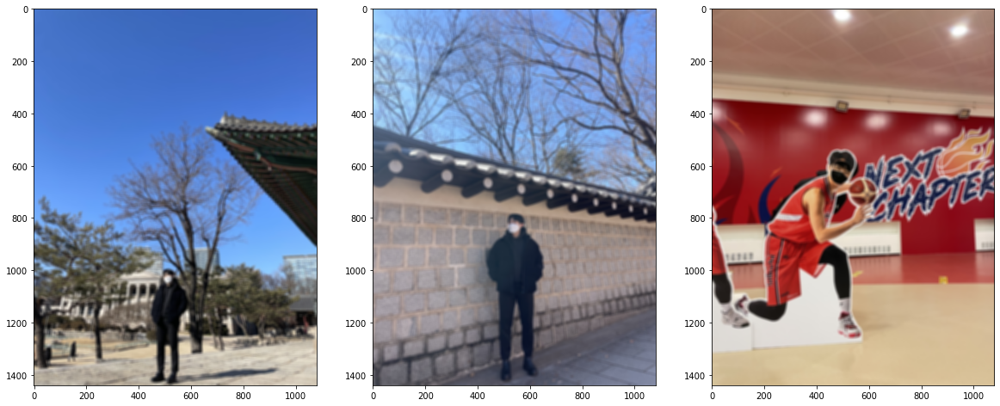

In [35]:
def img_blur(img_orig, ksize=(13, 13)):
    img_orig_blur = cv2.blur(img_orig, (13,13))  
    return img_orig_blur

img1_blur = img_blur(img1)
img2_blur = img_blur(img2)
img3_blur = img_blur(img3)

show_imgs(img1_blur, img2_blur, img3_blur)

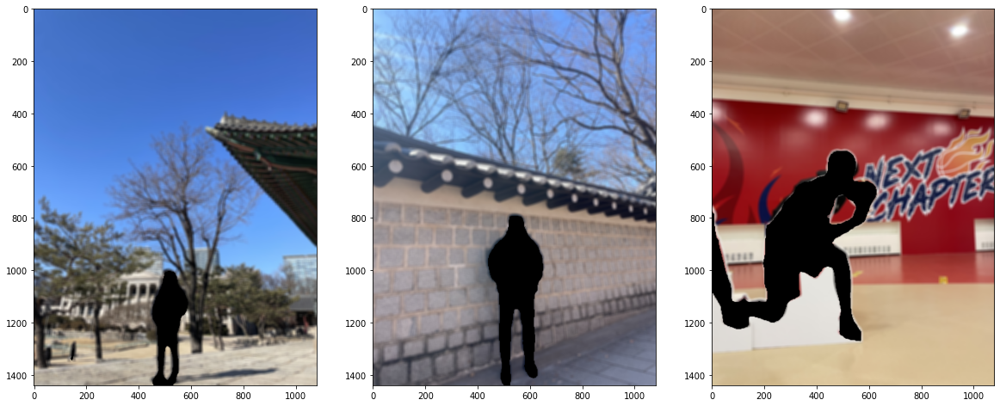

In [36]:
def get_bg(img_orig_blur, img_mask):
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    return img_bg_blur, img_mask_color

img1_bg_blur, img1_mask_color = get_bg(img1_blur, img_mask1)
img2_bg_blur, img2_mask_color = get_bg(img2_blur, img_mask2)
img3_bg_blur, img3_mask_color = get_bg(img3_blur, img_mask3)

show_imgs(img1_bg_blur, img2_bg_blur, img3_bg_blur)

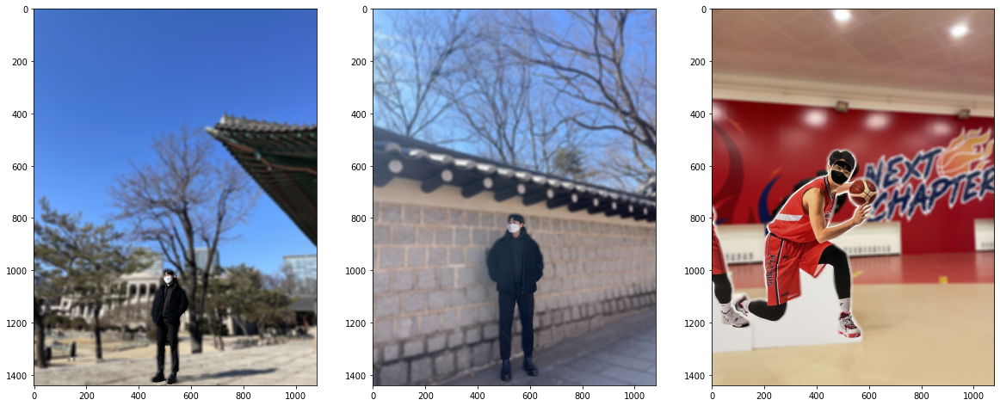

In [37]:
img1_concat = np.where(img1_mask_color==255, img1, img1_bg_blur)
img2_concat = np.where(img2_mask_color==255, img2, img2_bg_blur)
img3_concat = np.where(img3_mask_color==255, img3, img3_bg_blur)

show_imgs(img1_concat, img2_concat, img3_concat)

#### 인물 사진 모드를 함수화 하여 사용하자!

In [38]:
def get_mode_blur(filename, seg_id=15, blursize=(13, 13), figsize=(20,20)):
    '''
    각 단계에서 필요한 코드만 통합하여 함수화 한다.
    파일이 같은 폴더에 있다는 가정하에, 파일 이름을 필요로 하고, 기본 인물로 설정하며 seg_id를 조절하면 다른 object에 대해서도 가능.
    blursize는 블러할 때 커널 사이즈를 말하며, figsize는 이미지를 출력할 때 plot의 크기를 의미한다.
    최종 이미지를 리턴하며, 원본 이미지과 최종 이미지를 나란히 화면에 출력한다.
    '''
    img_path = get_img_path(filename)
    img_orig = get_img(img_path)
    
    fig = plt.figure(figsize=figsize)
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    
    segvalues, output = segmentation(img_path)
    
    LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
    ]

    print('* Label of Segmentation')
    for class_id in segvalues['class_ids']:
        print(LABEL_NAMES[class_id])    
        
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    seg_color = tuple(i for i in reversed(colormap[seg_id]))
    
    seg_map = np.all(output==seg_color, axis=-1)
    
    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255

    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    # 원본 이미지와 마스트를 적당히 합쳐봅니다
    # 0.6과 0.4는 두 이미지를 섞는 비율입니다.
    img_show = img_orig.copy()
    img_show = cv2.addWeighted(img_show, 0.3, color_mask, 0.7, 0.0)
    ax2 = fig.add_subplot(1,3,2)
    ax2.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))

    img_orig_blur = cv2.blur(img_orig, blursize) 
    
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    
    img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
    
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    
    plt.show()
    
    return img_concat

Shape of img4.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person


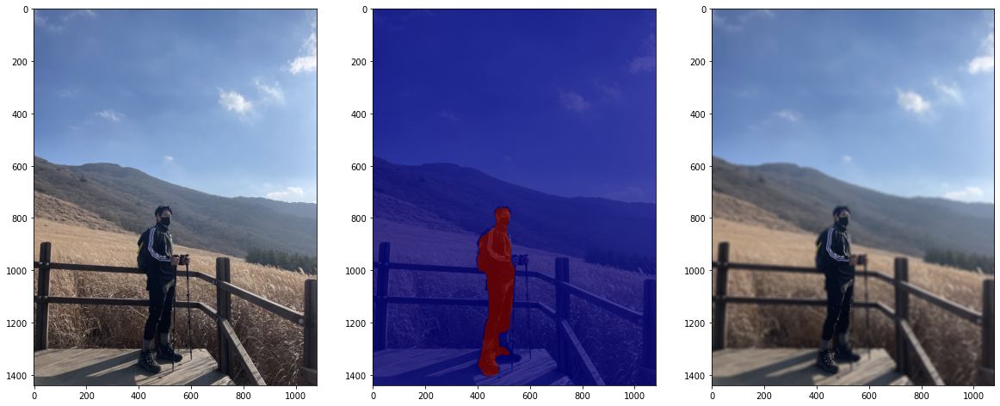

In [39]:
img4 = get_mode_blur('img4.jpg', blursize=(13, 13))

Shape of img5.jpg:  (1080, 1440, 3)
* Label of Segmentation
background
person


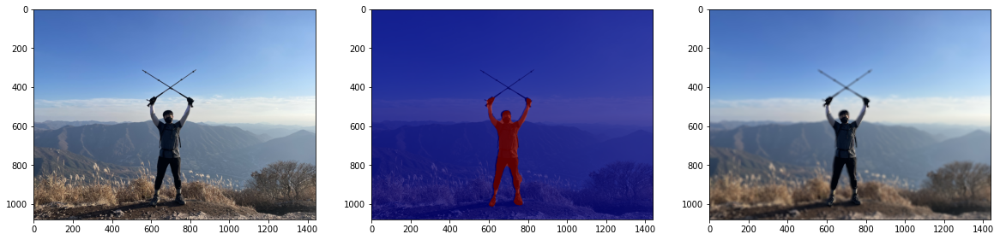

In [40]:
img5 = get_mode_blur('img5.jpg', blursize=(13, 13))

Shape of img6.jpg:  (1080, 1440, 3)
* Label of Segmentation
background
person


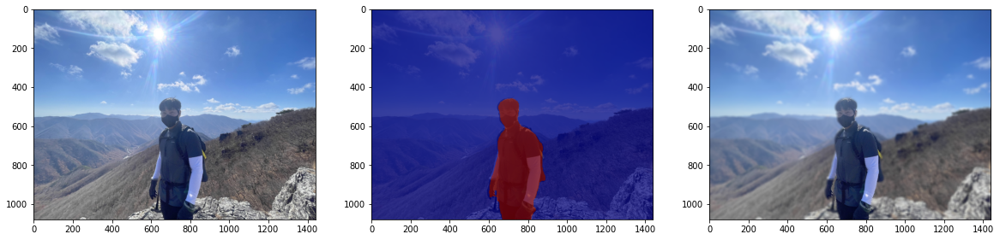

In [41]:
img6 = get_mode_blur('img6.jpg', blursize=(13, 13))

Shape of img7.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person
sofa


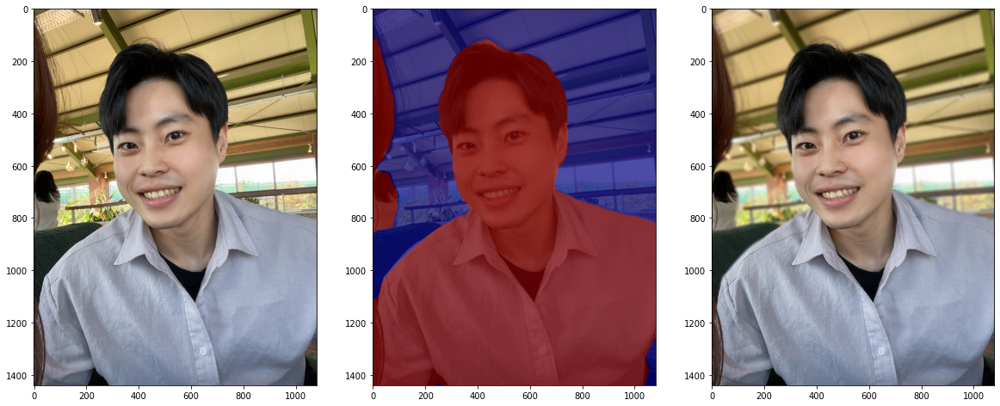

In [42]:
img7 = get_mode_blur('img7.jpg')

Shape of img8.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person


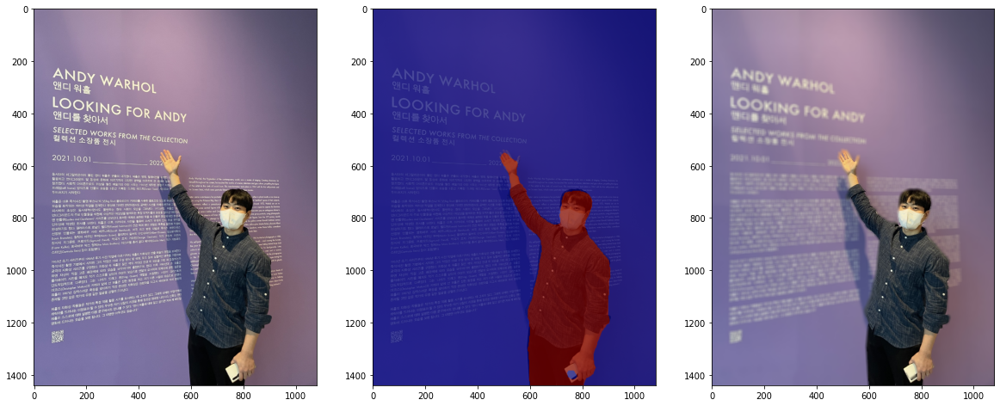

In [43]:
img8 = get_mode_blur('img8.jpg', blursize=(13, 13))

Shape of img9.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
chair
person
pottedplant


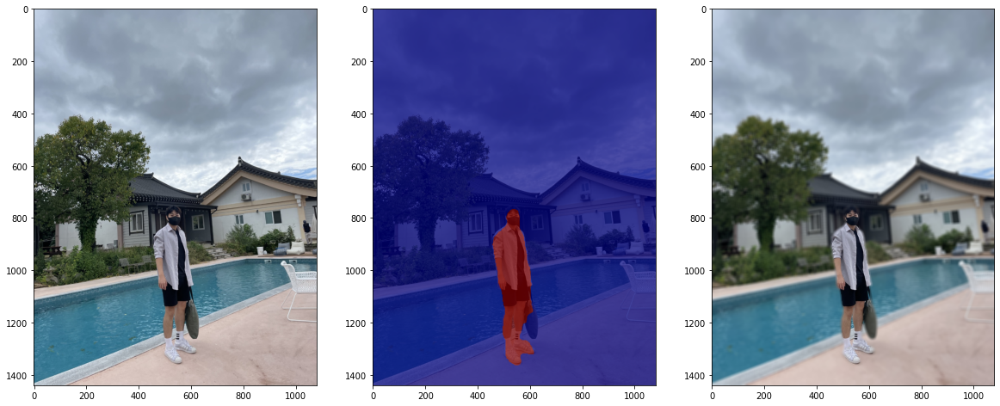

In [44]:
img9 = get_mode_blur('img9.jpg', blursize=(13, 13))

Shape of img10.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person


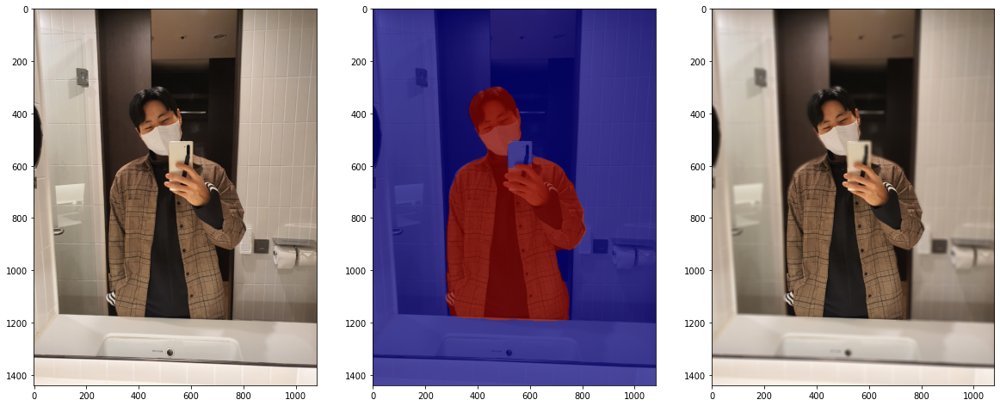

In [45]:
img10 = get_mode_blur('img10.jpg', blursize=(13, 13))

#### 인물이 주인공이 아닌, 귀여운 고양이에 대한 아웃포커싱 사진도 만들어 볼 수 있을 것입니다.

Shape of cat1.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
cat


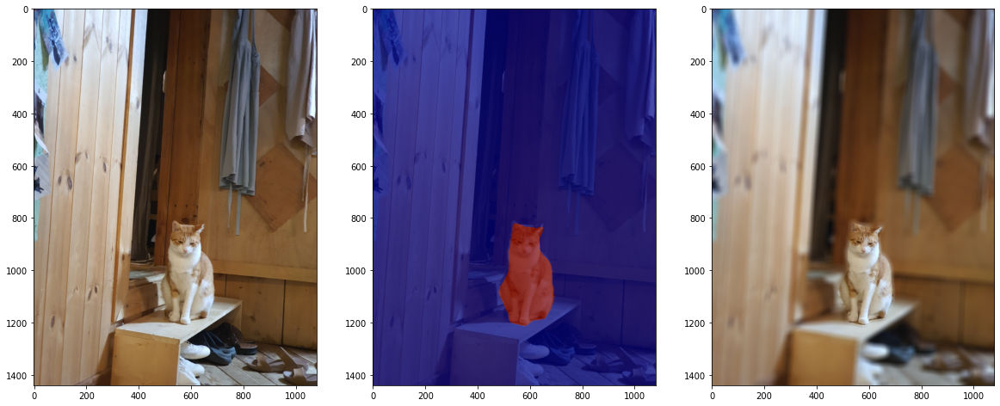

In [46]:
cat1 = get_mode_blur('cat1.jpg', seg_id = 8, blursize=(25, 25), figsize=(20,15))

Shape of cat2.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
cat
person


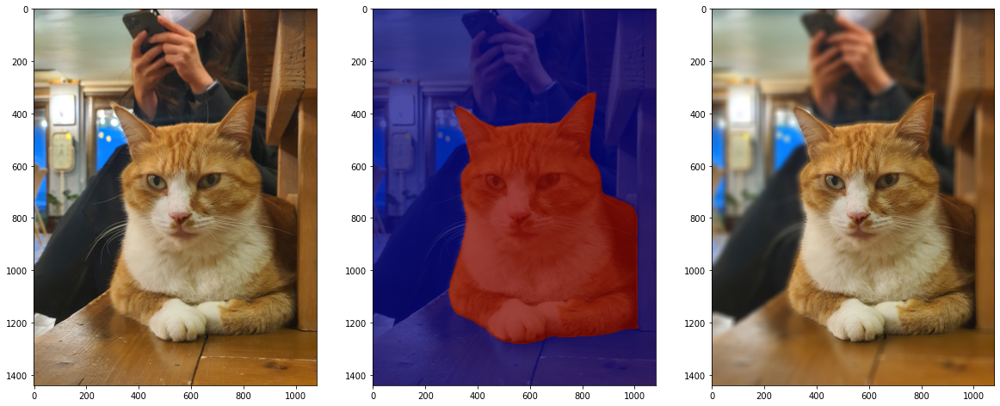

In [47]:
cat2 = get_mode_blur('cat2.jpg', seg_id = 8, blursize=(25, 25))

Shape of cat3.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
cat


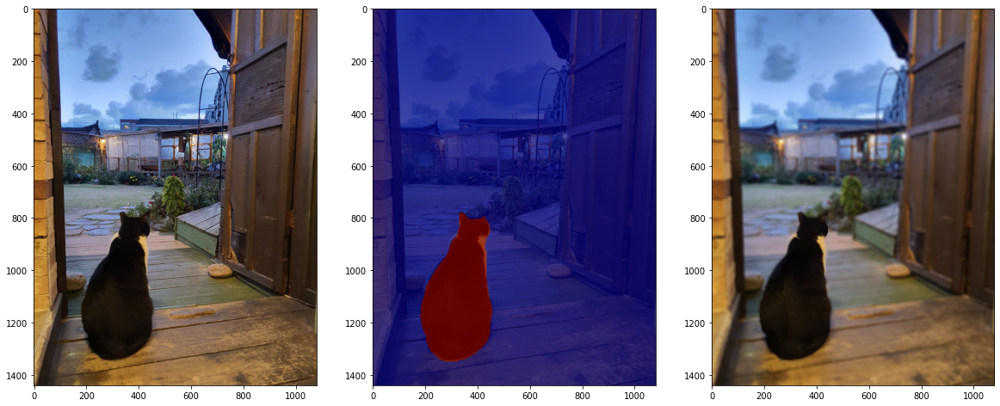

In [48]:
cat3 = get_mode_blur('cat3.jpg', seg_id = 8)

#### 배경을 blur하는 인물모드 사진이 아니라 배경사진을 다른 이미지로 교체하는 크로마키 배경 합성을 시도해 볼 수도 있을 것입니다.

In [49]:
def get_mode_chromakey(filename, bgname, seg_id=15, blursize=(13, 13), figsize=(20,20)):
    '''
    각 단계에서 필요한 코드만 통합하여 함수화 한다.
    파일이 같은 폴더에 있다는 가정하에, 파일 이름을 필요로 하고, 기본 인물로 설정하며 seg_id를 조절하면 다른 object에 대해서도 가능.
    blursize는 블러할 때 커널 사이즈를 말하며, figsize는 이미지를 출력할 때 plot의 크기를 의미한다.
    최종 이미지를 리턴하며, 원본 이미지과 최종 이미지를 나란히 화면에 출력한다.
    '''
    img_path = get_img_path(filename)
    img_orig = get_img(img_path)
    
    rows, cols, channels = img_orig.shape
    
    fig = plt.figure(figsize=figsize)
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    
    segvalues, output = segmentation(img_path)
    
    LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
    ]

    print('* Label of Segmentation')
    for class_id in segvalues['class_ids']:
        print(LABEL_NAMES[class_id])    
        
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    seg_color = tuple(i for i in reversed(colormap[seg_id]))
    
    seg_map = np.all(output==seg_color, axis=-1)
    
    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255

    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    # 원본 이미지와 마스크를 적당히 합쳐봅니다
    # 0.6과 0.4는 두 이미지를 섞는 비율입니다.
    img_show = img_orig.copy()
    img_show = cv2.addWeighted(img_show, 0.3, color_mask, 0.7, 0.0)
    ax2 = fig.add_subplot(1,3,2)
    ax2.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))

    img_orig_blur = cv2.blur(img_orig, blursize) 
       
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    
    bg_path = get_img_path(bgname)
    bg = get_img(bg_path)
    bg_rows, bg_cols, bg_channels = bg.shape
    
    bg_resized = cv2.resize(bg, (cols, rows))
    print(bg_resized.shape)
    bg_blurred = cv2.bitwise_and(bg_resized, img_bg_mask)
    
    img_concat = np.where(img_mask_color==255, img_orig, bg_blurred)
    
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    
    plt.show()
    
    return img_concat

Shape of img1.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person
Shape of bg2.jpg:  (1024, 819, 3)
(1440, 1080, 3)


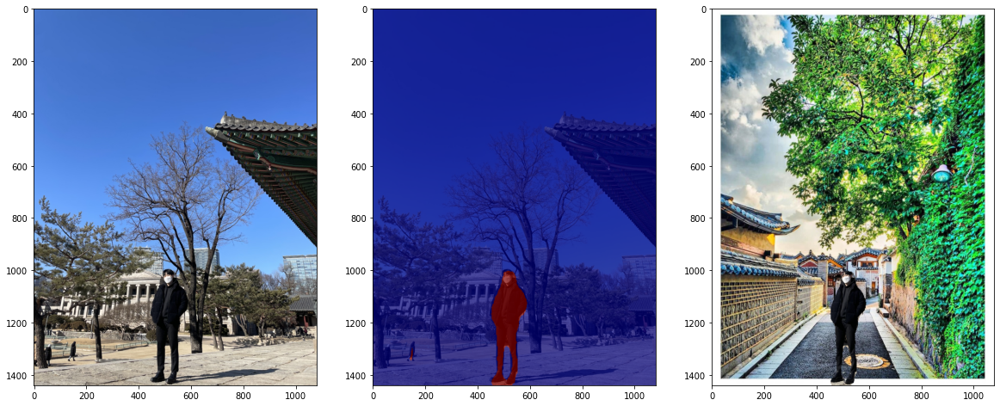

In [50]:
crmk1 = get_mode_chromakey('img1.jpg', 'bg2.jpg', seg_id=15, blursize=(13, 13), figsize=(20,20))

Shape of img9.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
chair
person
pottedplant
Shape of bg5.jpg:  (1536, 1536, 3)
(1440, 1080, 3)


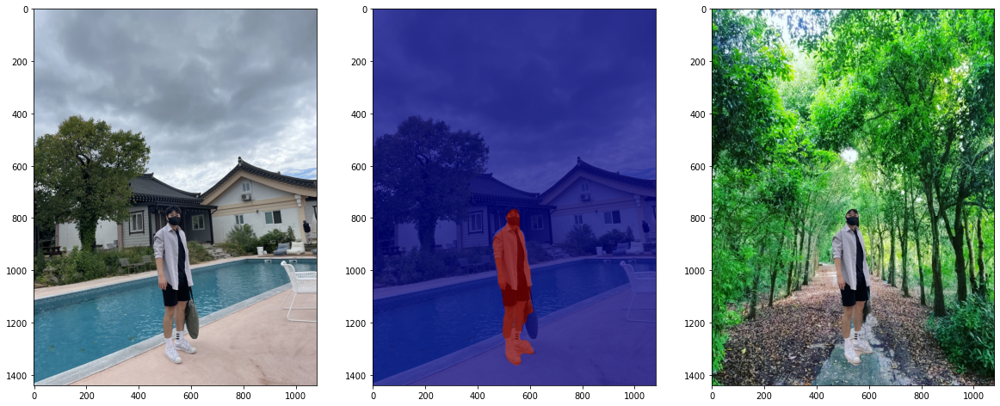

In [51]:
crmk2 = get_mode_chromakey('img9.jpg', 'bg5.jpg')

Shape of img5.jpg:  (1080, 1440, 3)
* Label of Segmentation
background
person
Shape of bg6.jpg:  (2688, 1242, 3)
(1080, 1440, 3)


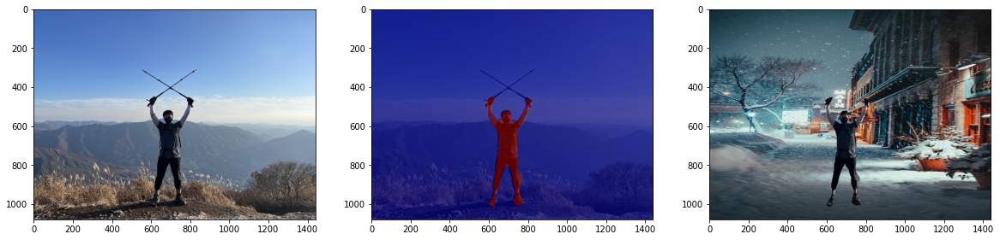

In [52]:
crmk3 = get_mode_chromakey('img5.jpg', 'bg6.jpg')

Shape of img8.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person
Shape of bg8.jpg:  (1080, 1920, 3)
(1440, 1080, 3)


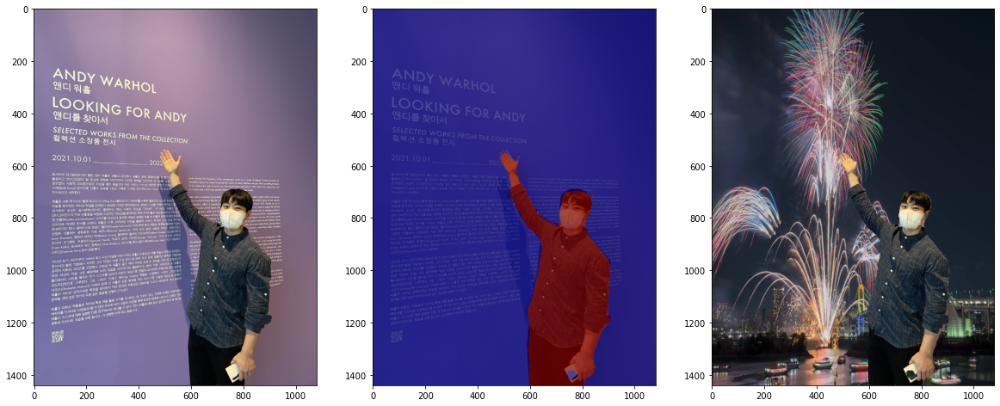

In [53]:
crmk4 = get_mode_chromakey('img8.jpg', 'bg8.jpg')

# Step 2. 사진에서 문제점 찾기

#### 세그멘테이션 문제!

Shape of img10.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person


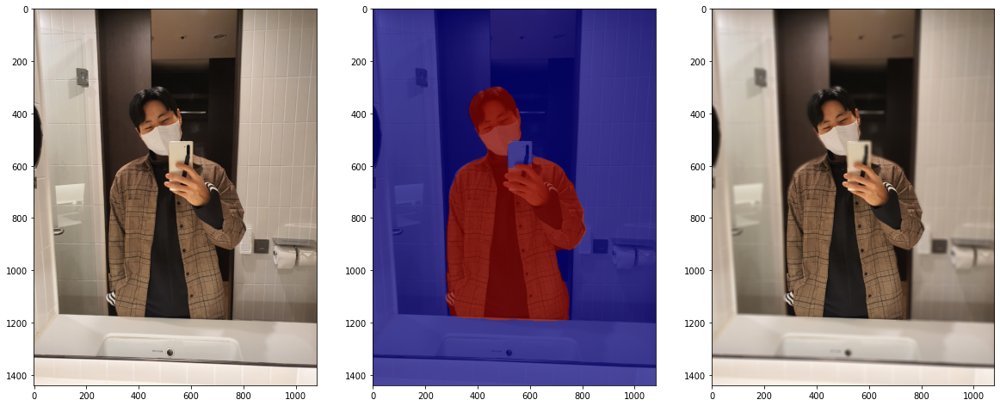

In [54]:
img10 = get_mode_blur('img10.jpg', blursize=(13, 13))

핸드폰도 손과 같은 depth 위치에 있지만 사람이 아니므로 함께 세그멘테이션 되지 못했다.

Shape of img9.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
chair
person
pottedplant


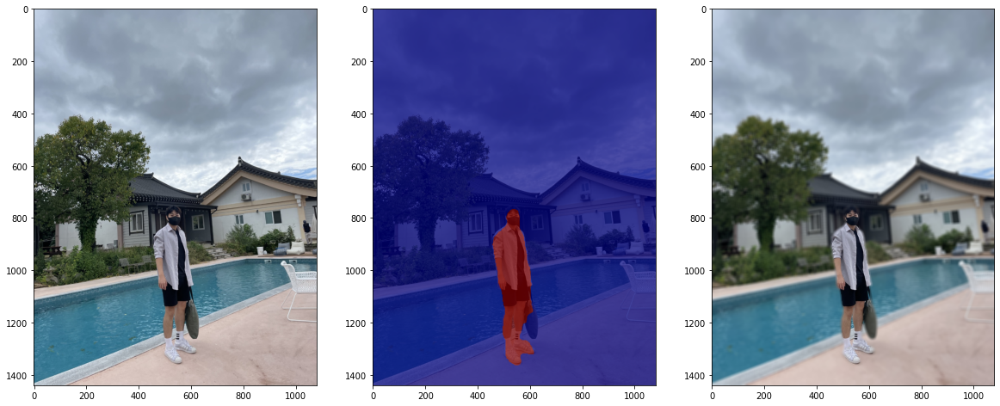

In [55]:
img9 = get_mode_blur('img9.jpg', blursize=(13, 13))

가방도 사람과 더불어 같은 depth에 있는 덩어리로 봐야하는데 세그멘테이션이 사람만 되었다.  
또한, 머리카락이 배경과 비슷한 색이 되어 사람 세그멘테이션에 포함되지 못했다.

Shape of img5.jpg:  (1080, 1440, 3)
* Label of Segmentation
background
person
Shape of bg6.jpg:  (2688, 1242, 3)
(1080, 1440, 3)


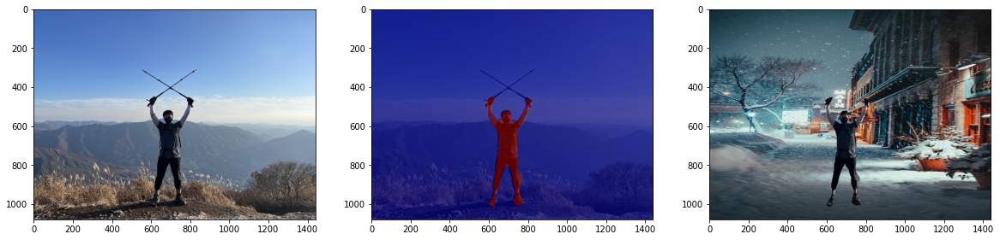

In [56]:
crmk3 = get_mode_chromakey('img5.jpg', 'bg6.jpg')

원본 이미지에는 인물이 스틱을 교차하여 들고 있지만 이는 사람이 아니므로 사람 세그멘테이션에 포함되지 못했다.  
최종 결과에서 스틱은 사라지고 만세를 하고 있는 모습으로 표현된다.

Shape of img7.jpg:  (1440, 1080, 3)
* Label of Segmentation
background
person
sofa


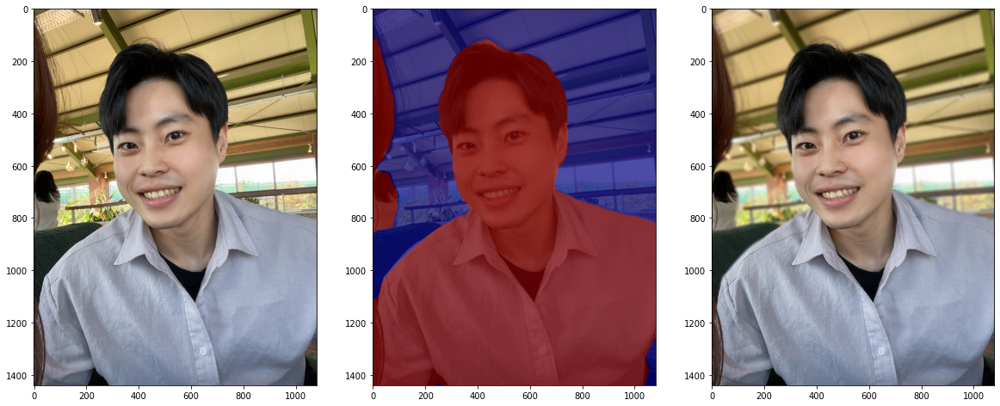

In [57]:
img7 = get_mode_blur('img7.jpg')

중심 인물 이외에 뒤에 지나가는 인물과 옆 인물의 머리카락 일부분이 역시나 사람으로 세그멘테이션 되었다.  
이 경우에는 각 세그멘테이션 카테고리마다 인덱스가 없이 하나로 되기 때문!!!

\* 위 몇가지 경우 이외에도 세그멘테이션 경계가 확실하지 않으므로 인물 모드에서 인물의 일부가 블러되거나,  
배경의 일부가 블러가 되지 않는 현상이 나타남!  

\* 세그멘테이션 기법의 성능이 상당히 좋아 세그멘테이션이 잘 수행되지만, 자세히 보면 가장자리의 디테일이 많이 떨어진다.

# Step 3. 해결 방법을 제안해 보기

#### 심도계

위에서 실행한 세그멘테이션은 심도계 표현이 포함되지 않았다.  
일반적으로 심도계는 카메라를 두 대 이상 사용하여 얻어진 영상을 캘리브레이션 하여 영상에서 object들의 깊이 정보를 나타내는 방식으로 사용한다.  
최근에는 딥러닝의 발달로 두 대 이상의 멀티카메라 환경이 아닌 싱글 카메라 환경에서도 충분히 성능이 나오는 경우가 많다.
그러므로 노드에서도 설명되었던 최신 기법을 활용하여 영상의 depth를 획득하여 활용할 수 있다.

(1) 영상에서 depth를 얻게 되면 이는 연속된 범위를 가지므로, depth를 구간화 하여 어느정도 활용할지 정한다.  
(2) 세그멘테이션된 영상과 구간화된 depth정보와 대조한다.  
  -> 같은 카테고리로 분류되었으며 한 덩어리로 된 영역(세그멘테이션)은 같은 depth구간에 속해야한다.  
  -> 그렇지 않은 경우, 덩어리 영역을 같은 구간이 끝날때까지 확장하는 방법으로 가장자리를 정리할 수 있다.
  
#### 인덱스

같은 카테고리라도 필요하지 않은 영역이 있을 수 있다.  
(예를 들어 한 명의 인물에게만 효과를 주고 싶은데 이미지에 인물이 여러명 있는경우 모두 통합하여 효과를 적용한다.)  
그러므로 같은 카테고리로 분류되었더라도 object가 떨어져있다면 각각에 인덱스를 부여하는 방법으로 해결할 수 있을것으로 보인다.

(1) 영상에 세그멘테이션을 수행한다.  
(2) OpenCV를 활용하면 어떤 일부 영역의 컨투어를 구할 수 있는데, 이를 활용하여 같은 카테고리로 분류되었지만 각각이 하나의 컨투어인 경우 각각에 인덱스를 부여한다.  
(3) 프로그램 전체 구동 설정에 여러 object를 처리할 것인지 하나의 object만 처리할 것인지를 선택할 수 있게 한다.

#### 가이드 필터

딥러닝 성능이 상당히 발전했지만 위에서도 언급했듯 가장자리(Edge)의 디테일이 많이 떨어지는 경우가 있다.  
이런 경우, 마스크 영상을 활용해보는 방법도 생각해 볼 수 있다.  
마스크 영상을 활용할 때에는 가이드 필터[1]를 활용해 볼 수 있다.  
가이드 필터를 간단히 말하면, 영상을 필터링 하는데 가이드 영상을 주어 원하는 형태로 필터링을 할 수 있는 것이다.

(1) 영상에 세그멘테이션을 진행하여 원하는 카테고리의 마스크 영상을 만든다(흑백 영상)  
(2) 입력 영상으로 마스크 영상을, 가이드 영상으로 원본 영상을 넣어주어 가이드 필터링을 수행하면 마스크 영상의 가장자리 디테일이 잘 살아있는 새로운 마스크 영상을 얻을 수 있다.  
(3) 새로 얻은 마스크 영상을 새로운 마스크 영상으로 하여 인물 모드와 같은 효과를 적용한다.


가이드 필터에 대한 참고 사이트  
https://velog.io/@claude_ssim/%EA%B3%84%EC%82%B0%EC%82%AC%EC%A7%84%ED%95%99-Edge-Aware-Image-Filtering-Guided-Filtering


[1] He, K., Sun, J., & Tang, X. (2013). Guided image filtering. IEEE transactions on pattern analysis and machine intelligence, 35(6), 1397-1409.

---

### 평가 루브릭

1. 인물모드 사진을 성공적으로 제작하였다.  
  -> 아웃포커싱 효과가 적용된 본인의 인물모드 사진과 고양이 사진, 배경전환 크로마키사진을 각각 1장 이상 성공적으로 제작하였다.


2. 제작한 인물모드 사진들에서 나타나는 문제점을 정확히 지적하였다.  
  -> 인물사진에서 발생한 문제점을 정확히 지적한 사진을 제출하였다.  


3. 인물모드 사진의 문제점을 개선할 수 있는 솔루션을 적절히 제시하였다.  
  -> 추가적인 depth 정보를 활용하여 semantic segmentation mask의 오류를 보완할 수 있는 좋은 솔루션을 구체적으로 제시하였다.
  
---

# 회고

1. 아웃포커싱 효과를 직접 찍은 인물 사진과 고양이 사진에 적용하였고, 배경을 다른 사진으로 교체하는 크로마키 효과도 성공적으로 적용했다.  
노드를 따라하며 코드에 대해 이해하고 그대로 따라하며 세 개의 사진을 한꺼번에 처리하는 함수들을 정의해서 활용해보았다.  
또한, 전체 과정을 한번에 수행할 수 있는 함수를 작성하여 편리하게 효과를 적용할 수 있도록 했다.  
평소에는 함수화를 잘 안했었지만, 이렇게 함수화하여 사용하니 확실히 편리하다는걸 느꼈다.  
함수화도 좋지만 다음에는 클래스를 활용하는 방법도 고려해볼 예정이다.


2. 인물모드를 단순한 세그멘테이션 하나만 활용하다보니 충분히 만족스러운 결과를 얻을 수 없었다.  
세그멘테이션된 영역의 가장자리가 깔끔하게 정리되지 않았고, 필요없는 영역이더라도 같은 카테고리이기에 함께 그룹화 되었다.  
아웃포커싱을 이용한 인물 모드에서는 원하는 인물만을 선택할 수 없는 단점도 있었다.  


3. 일반적으로 생각할 수 있는 방법으로 depth 정보를 이용하는 방법과 카테고리 그룹을 해체하여 인덱싱하는 방법을 제시했다.  
여기에 더해 가이드 필터링 방법을 제시했다.  
이전에 한 번 접해본 경험이 있어 생각이 난 방법으로, 원본 영상을 가이드로 입력해서 마스크 영상에 필터링을 하게 되면,  
마스크 영상의 가장자리가 디테일하게 살아난다.  
이 방법을 이용하면 물리적으로 아웃포커싱하여 찍은 사진과 유사한 결과 영상을 얻을 수 있을 것이라 생각한다.


4. 코드를 함수화하여 사용하는 것에 대한 편의성을 느꼈다. 그동안 조금 번거롭다는 생각에 편할거라는 생각은 했지만 실행에 옮기지 않았었다.  
그러나 직접 적용해보니 생각보다 번거롭지도 않았고 활용도는 생각보다 더 좋았다.  
파이썬은 클래스를 활용해야 제대로 활용하는거라고 하던데....클래스 활용에 대해 고민해 볼 필요가 있다.  
함수화도 안해봐서 어색한 것이었기에 클래스를 활용하는 것도 충분히 익숙해 질 것이라고 생각한다.


5. 전체적으로 CV 주제였기에 어렵지 않게 할 수 있었다.  
OpenCV 자체를 많이 접해봤었기에 익숙하긴 하지만, 파이썬이 아닌 C++로만 활용해봤어서 그런지 익숙함 속에서도 생소한 것들이 너무 많다.  
화이팅..!